Question: Does the time of day play any importance on when certain products are ordered?

I will be using “The Instacart Online Grocery Shopping Dataset 2017” for my analysis. This anonymized dataset contains a sample of over 3 million grocery orders from more than 200,000 Instacart users.

I will be using pandas for my exploritory data wrangling. I have added a code for randomly selecting 'n' ammount of unique user_id values from the large orders dataframe. I did this because I wanted to use Tableau to visualize my data but unfortunately theres a limit of on rows for a dataframe (15 million is the Tableau limit, the large_orders dataframe comes to around 32 million)

In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import seaborn as sns; sns.set() # graphing data
import matplotlib.colors as colors
from scipy import stats

color = sns.color_palette()

pd.options.mode.chained_assignment = None  # default='warn'
pd.set_option('display.max_rows', None)

plt.style.use('fivethirtyeight') #plot style
sns.set_style("whitegrid")
pd.set_option('display.max_columns', None)

Before we dive deep into the exploratory analysis, let us know a little more about the files given. To understand it better, let us first read all the files as dataframe objects and then look at the top few rows.

In [3]:
aisles = pd.read_csv('aisles.csv')
departments = pd.read_csv('departments.csv')
orderspp = pd.read_csv('order_products__prior.csv')
orderpt = pd.read_csv('order_products__train.csv') #don't use this one 
orders = pd.read_csv('orders.csv')
products = pd.read_csv('products.csv')
#samples = pd.read_csv('sample_submission.csv')

In [4]:
orders.head(10)
#samples.head(10)

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,prior,1,2,8,NaN
1,2398795,1,prior,2,3,7,15.0
2,473747,1,prior,3,3,12,21.0
3,2254736,1,prior,4,4,7,29.0
4,431534,1,prior,5,4,15,28.0
5,3367565,1,prior,6,2,7,19.0
6,550135,1,prior,7,1,9,20.0
7,3108588,1,prior,8,1,14,14.0
8,2295261,1,prior,9,1,16,0.0
9,2550362,1,prior,10,4,8,30.0


In [5]:
orders.shape

(3421083, 7)

In [6]:
aisles.head(10)

,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation
5,6,other
6,7,packaged meat
7,8,bakery desserts
8,9,pasta sauce
9,10,kitchen supplies


In [7]:
aisles.shape

(134, 2)

In [8]:
departments.head(10)

,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol
5,6,international
6,7,beverages
7,8,pets
8,9,dry goods pasta
9,10,bulk


In [9]:
departments.shape

(21, 2)

In [10]:
products.head(10)

,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13
5,6,Dry Nose Oil,11,11
6,7,Pure Coconut Water With Orange,98,7
7,8,Cut Russet Potatoes Steam N' Mash,116,1
8,9,Light Strawberry Blueberry Yogurt,120,16
9,10,Sparkling Orange Juice & Prickly Pear Beverage,115,7


In [11]:
products.shape

(49688, 4)

In [12]:
orderspp.head(10)

,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1
1,2,28985,2,1
2,2,9327,3,0
3,2,45918,4,1
4,2,30035,5,0
5,2,17794,6,1
6,2,40141,7,1
7,2,1819,8,1
8,2,43668,9,0
9,3,33754,1,1


In [13]:
orderspp.shape

(32434489, 4)

In [14]:
orderpt.head(10)

,order_id,product_id,add_to_cart_order,reordered
0,1,49302,1,1
1,1,11109,2,1
2,1,10246,3,0
3,1,49683,4,0
4,1,43633,5,1
5,1,13176,6,0
6,1,47209,7,0
7,1,22035,8,1
8,36,39612,1,0
9,36,19660,2,1


In [15]:
orderpt.shape

(1384617, 4)

As we could see, orders.csv has all the information about the given order id like the user who has purchased the order, when was it purchased, days since prior order and so on.

The columns present in order_products_train and order_products_prior are same. 

As mentioned earlier, in this dataset, 4 to 100 orders of a customer are given. So the last order of the user has been taken out and divided into train and test sets. All the prior order informations of the customer are present in order_products_prior file. We can also note that there is a column in orders.csv file called eval_set which tells us as to which of the three datasets (prior, train or test) the given row goes to.

Order_products*csv file has more detailed information about the products that been bought in the given order along with the re-ordered status.

Let us first get the count of rows in each of the three sets.

In [16]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3421083 entries, 0 to 3421082
Data columns (total 7 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   order_id                int64  
 1   user_id                 int64  
 2   eval_set                object 
 3   order_number            int64  
 4   order_dow               int64  
 5   order_hour_of_day       int64  
 6   days_since_prior_order  float64
dtypes: float64(1), int64(5), object(1)
memory usage: 182.7+ MB


In [17]:
orders.describe()

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
count,3.421083e+06,3.421083e+06,3.421083e+06,3.421083e+06,3.421083e+06,3.214874e+06
mean,1.710542e+06,1.029782e+05,1.715486e+01,2.776219e+00,1.345202e+01,1.111484e+01
std,9.875817e+05,5.953372e+04,1.773316e+01,2.046829e+00,4.226088e+00,9.206737e+00
min,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,8.552715e+05,5.139400e+04,5.000000e+00,1.000000e+00,1.000000e+01,4.000000e+00
50%,1.710542e+06,1.026890e+05,1.100000e+01,3.000000e+00,1.300000e+01,7.000000e+00
75%,2.565812e+06,1.543850e+05,2.300000e+01,5.000000e+00,1.600000e+01,1.500000e+01
max,3.421083e+06,2.062090e+05,1.000000e+02,6.000000e+00,2.300000e+01,3.000000e+01


In [18]:
orders.shape

(3421083, 7)

In [19]:
orders['eval_set'].value_counts(dropna=False)

prior    3214874
train     131209
test       75000
Name: eval_set, dtype: int64

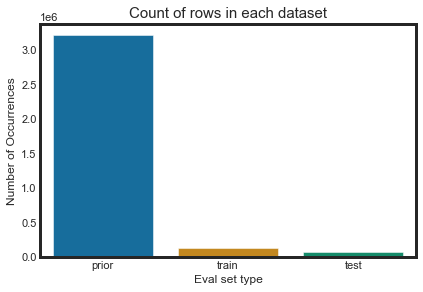

In [20]:
# quick visualization to see the differences of types

sns.set_style("white")
sns.plotting_context('notebook')

palette6 = sns.color_palette("colorblind")


cnt_srs = orders.eval_set.value_counts()


sns.barplot(cnt_srs.index, cnt_srs.values,palette=palette6)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Eval set type', fontsize=12)
plt.title('Count of rows in each dataset', fontsize=15)
plt.xticks(rotation='horizontal')
plt.show()

In [21]:
orders.isnull().sum()

order_id                       0
user_id                        0
eval_set                       0
order_number                   0
order_dow                      0
order_hour_of_day              0
days_since_prior_order    206209
dtype: int64

Interesting...the days_since_prior_order column has 206209 null values. Upon further inspection, these null values show that the user had not ordered using Instacart before. Basically the user's first order on Instacart. This also shows that we have 206209 customers in this dataframe.

In [22]:
# orders = orders[orders['days_since_prior_order'].notna()]
# orders.isnull().sum()

Now I want to check out some distributions. There are a couple of columns that I'm interested in. order_hour_of_day, order_dow,  order_number, days_since_prior_order. 

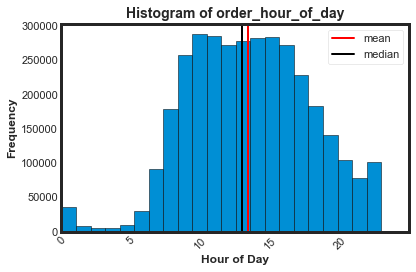

In [23]:
#Histogram for the order_hour_of_day column 
mean=orders['order_hour_of_day'].mean()
median=orders['order_hour_of_day'].median()

orders.hist(column='order_hour_of_day', bins=22,edgecolor='black')

plt.xlim(0,25)

plt.title('Histogram of order_hour_of_day',size=14,fontweight='bold')
plt.xlabel('Hour of Day',size=12,fontweight='semibold')
plt.ylabel('Frequency',size=12,fontweight='semibold')
plt.xticks(rotation=45)
plt.grid(b=None)


plt.xticks(np.arange(0, 25, 5))

plt.axvline(mean,color='red',label='mean',linewidth=2)
plt.axvline(median,color='black',label='median',linewidth=2)

plt.legend()

plt.tight_layout()

In [24]:
orders.describe()

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
count,3.421083e+06,3.421083e+06,3.421083e+06,3.421083e+06,3.421083e+06,3.214874e+06
mean,1.710542e+06,1.029782e+05,1.715486e+01,2.776219e+00,1.345202e+01,1.111484e+01
std,9.875817e+05,5.953372e+04,1.773316e+01,2.046829e+00,4.226088e+00,9.206737e+00
min,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,8.552715e+05,5.139400e+04,5.000000e+00,1.000000e+00,1.000000e+01,4.000000e+00
50%,1.710542e+06,1.026890e+05,1.100000e+01,3.000000e+00,1.300000e+01,7.000000e+00
75%,2.565812e+06,1.543850e+05,2.300000e+01,5.000000e+00,1.600000e+01,1.500000e+01
max,3.421083e+06,2.062090e+05,1.000000e+02,6.000000e+00,2.300000e+01,3.000000e+01


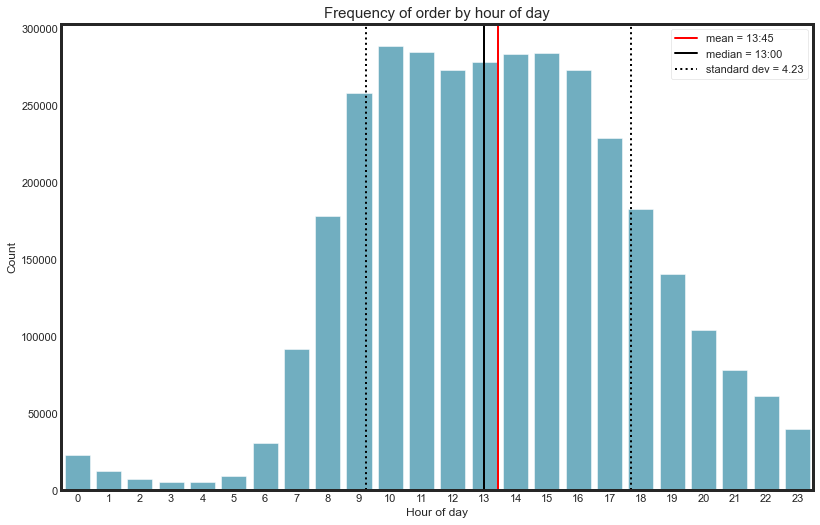

In [25]:
plt.figure(figsize=(12,8))

mean=orders['order_hour_of_day'].mean()
median=orders['order_hour_of_day'].median()

sns.countplot(x="order_hour_of_day", data=orders, color=color[9])
plt.ylabel('Count', fontsize=12)
plt.xlabel('Hour of day', fontsize=12)
plt.xticks(rotation='horizontal')
plt.title("Frequency of order by hour of day", fontsize=15)

plt.axvline(mean,color='red',label='mean = 13:45',linewidth=2)
plt.axvline(median,color='black',label='median = 13:00',linewidth=2)
plt.axvline(x=9.22, color='black',label='standard dev = 4.23', linestyle= ':',linewidth=2)
plt.axvline(x=17.68, color='black', linestyle= ':',linewidth=2)

plt.legend()

plt.show()

So majority of the orders are made during day time, between 10 am to 3pm . Now let us combine the day of week and hour of day to see the distribution.

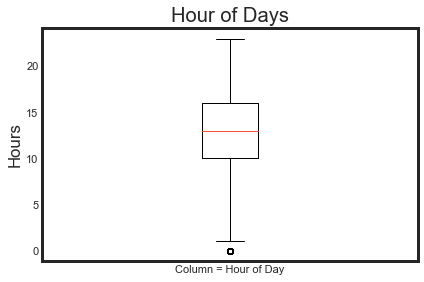

In [26]:
#boxplot for order_hour_of_day column 
x = orders['order_hour_of_day']
plt.boxplot(x)
ax = plt.gca()
ax.set_xticklabels(['Column = Hour of Day'])
ax.grid(False)
plt.ylabel('Hours')
plt.title('Hour of Days')
plt.show()

let us see how the ordering habit changes with day of week.

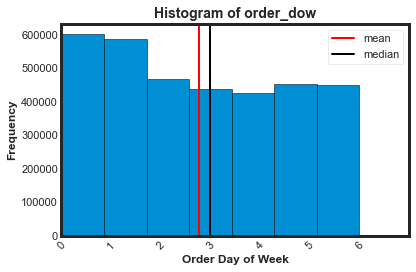

In [27]:
#Histogram for the order_dow column 
mean=orders['order_dow'].mean()
median=orders['order_dow'].median()

orders.hist(column='order_dow', bins=7,edgecolor='black')

plt.xlim(0,7)

plt.title('Histogram of order_dow',size=14,fontweight='bold')
plt.xlabel('Order Day of Week',size=12,fontweight='semibold')
plt.ylabel('Frequency',size=12,fontweight='semibold')
plt.xticks(rotation=45)
plt.grid(b=None)

plt.xticks(np.arange(0, 7, 1))

plt.axvline(mean,color='red',label='mean',linewidth=2)
plt.axvline(median,color='black',label='median',linewidth=2)

plt.legend()

plt.tight_layout()

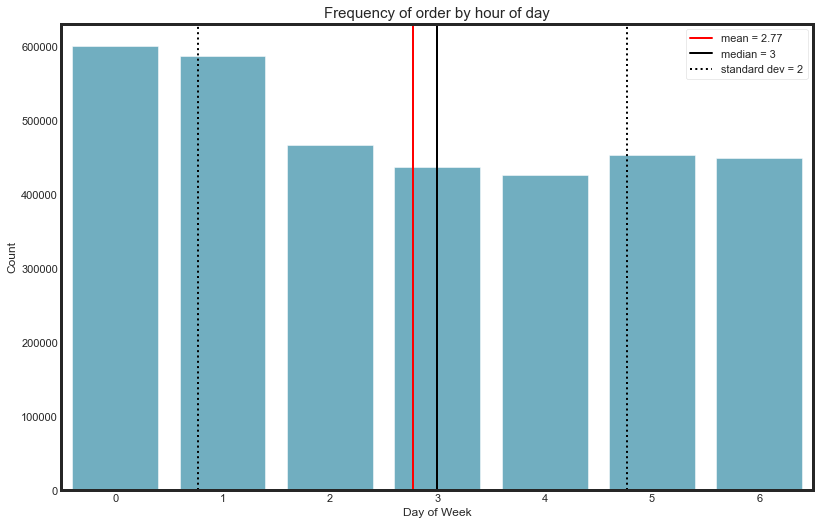

In [28]:
plt.figure(figsize=(12,8))

mean=orders['order_dow'].mean()
median=orders['order_dow'].median()

sns.countplot(x="order_dow", data=orders, color=color[9])
plt.ylabel('Count', fontsize=12)
plt.xlabel('Day of Week', fontsize=12)
plt.xticks(rotation='horizontal')
plt.title("Frequency of order by hour of day", fontsize=15)

plt.axvline(mean,color='red',label='mean = 2.77',linewidth=2)
plt.axvline(median,color='black',label='median = 3',linewidth=2)
plt.axvline(x=.77, color='black',label='standard dev = 2', linestyle= ':',linewidth=2)
plt.axvline(x=4.77, color='black', linestyle= ':',linewidth=2)

plt.legend()

plt.show()

Seems like 0 and 1 is Saturday and Sunday when the orders are high and low during Wednesday.

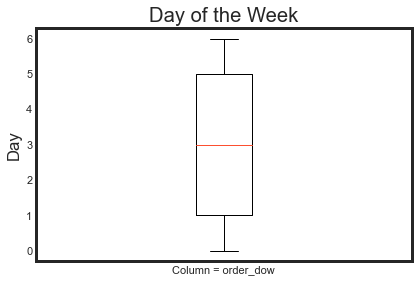

In [29]:
#boxplot for the order_dow column
x = orders['order_dow']
plt.boxplot(x)
ax = plt.gca()
ax.set_xticklabels(['Column = order_dow'])
ax.grid(False)
plt.ylabel('Day')
plt.title('Day of the Week')
plt.show()

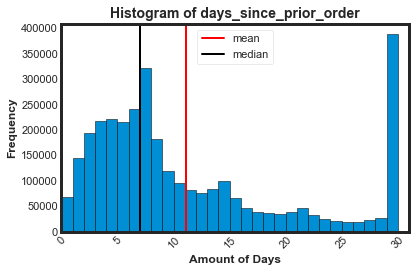

In [30]:
#Histogram for the days_since_prior_order column 
mean=orders['days_since_prior_order'].mean()
median=orders['days_since_prior_order'].median()

orders.hist(column='days_since_prior_order', bins=30,edgecolor='black')

plt.xlim(0,31)

plt.title('Histogram of days_since_prior_order',size=14,fontweight='bold')
plt.xlabel('Amount of Days',size=12,fontweight='semibold')
plt.ylabel('Frequency',size=12,fontweight='semibold')
plt.xticks(rotation=45)
plt.grid(b=None)

plt.xticks(np.arange(0, 31, 5))

plt.axvline(mean,color='red',label='mean',linewidth=2)
plt.axvline(median,color='black',label='median',linewidth=2)

plt.legend()

plt.tight_layout()

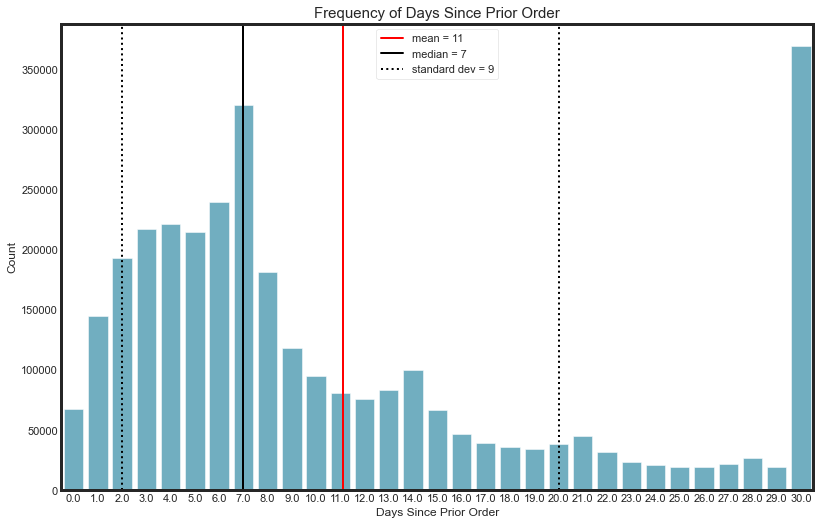

In [31]:
plt.figure(figsize=(12,8))

mean=orders['days_since_prior_order'].mean()
median=orders['days_since_prior_order'].median()

sns.countplot(x="days_since_prior_order", data=orders, color=color[9])
plt.ylabel('Count', fontsize=12)
plt.xlabel('Days Since Prior Order', fontsize=12)
plt.xticks(rotation='horizontal')
plt.title("Frequency of Days Since Prior Order", fontsize=15)

plt.axvline(mean,color='red',label='mean = 11',linewidth=2)
plt.axvline(median,color='black',label='median = 7',linewidth=2)
plt.axvline(x=2, color='black',label='standard dev = 9', linestyle= ':',linewidth=2)
plt.axvline(x=20, color='black', linestyle= ':',linewidth=2)

plt.legend()

plt.show()

C:\Users\crios\AppData\Roaming\Python\Python37\site-packages\matplotlib\cbook\__init__.py:1211: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
C:\Users\crios\AppData\Roaming\Python\Python37\site-packages\matplotlib\cbook\__init__.py:1218: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
C:\Users\crios\AppData\Roaming\Python\Python37\site-packages\matplotlib\cbook\__init__.py:1226: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
C:\Users\crios\AppData\Roaming\Python\Python37\site-packages\matplotlib\cbook\__init__.py:1227: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


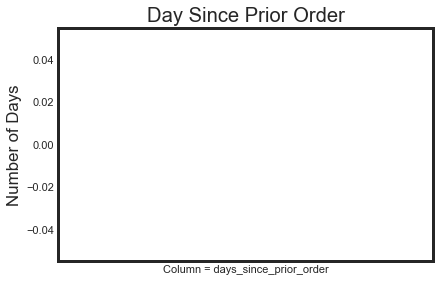

In [32]:
x = orders['days_since_prior_order']
plt.boxplot(x)
ax = plt.gca()
ax.set_xticklabels(['Column = days_since_prior_order'])
ax.grid(False)
plt.ylabel('Number of Days')
plt.title('Day Since Prior Order')
plt.show()

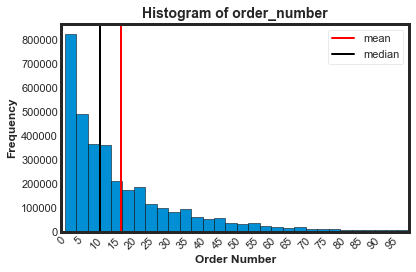

In [33]:
#Histogram for the order_number column 
mean=orders['order_number'].mean()
median=orders['order_number'].median()

orders.hist(column='order_number', bins=30,edgecolor='black')

plt.xlim(0,100)

plt.title('Histogram of order_number',size=14,fontweight='bold')
plt.xlabel('Order Number',size=12,fontweight='semibold')
plt.ylabel('Frequency',size=12,fontweight='semibold')
plt.xticks(rotation=45)


plt.xticks(np.arange(0, 100, 5))

plt.axvline(mean,color='red',label='mean',linewidth=2)
plt.axvline(median,color='black',label='median',linewidth=2)
plt.grid(b=None)

plt.legend()

plt.tight_layout()

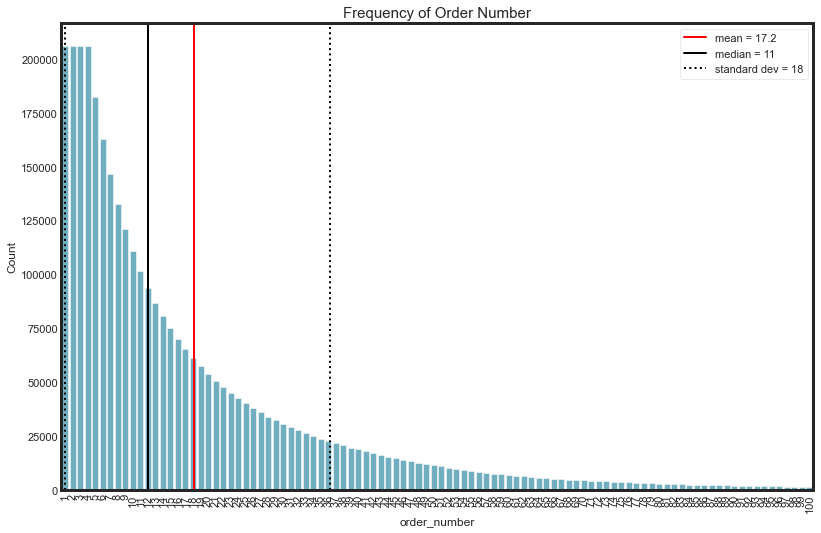

In [34]:
plt.figure(figsize=(12,8))

mean=orders['order_number'].mean()
median=orders['order_number'].median()

sns.countplot(x="order_number", data=orders, color=color[9])
plt.ylabel('Count', fontsize=12)
plt.xlabel('order_number', fontsize=12)
plt.xticks(rotation='vertical')
plt.title("Frequency of Order Number", fontsize=15)

plt.axvline(mean,color='red',label='mean = 17.2',linewidth=2)
plt.axvline(median,color='black',label='median = 11',linewidth=2)
plt.axvline(x=0, color='black',label='standard dev = 18', linestyle= ':',linewidth=2)
plt.axvline(x=35.2, color='black', linestyle= ':',linewidth=2)

plt.legend()

plt.show()

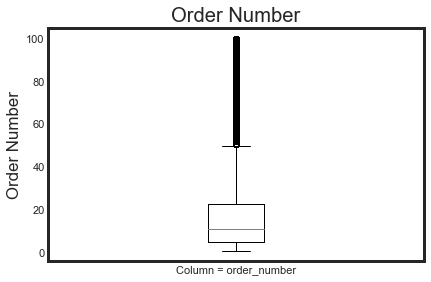

In [35]:
x = orders['order_number']
plt.boxplot(x)
ax = plt.gca()
ax.set_xticklabels(['Column = order_number'])
ax.grid(False)
plt.ylabel('Order Number')
plt.title('Order Number')
plt.show()

In [36]:
def get_unique_count(x):
    return len(np.unique(x))

cnt_srs = orders.groupby("eval_set")["user_id"].aggregate(get_unique_count)
cnt_srs

eval_set
prior    206209
test      75000
train    131209
Name: user_id, dtype: int64

So there are 206,209 customers in total.
Now let us validate the claim that 4 to 100 orders of a customer are given.

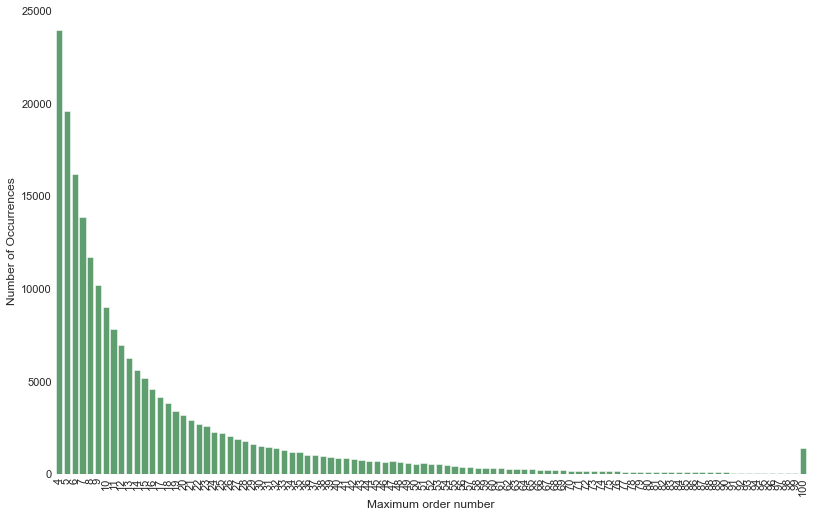

In [37]:
cnt_srs = orders.groupby("user_id")["order_number"].aggregate(np.max).reset_index()
cnt_srs = cnt_srs.order_number.value_counts()


plt.figure(figsize=(12,8))
sns.barplot(cnt_srs.index, cnt_srs.values, color=color[2])
sns.despine(left=True, right=True, top=True, bottom=True)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Maximum order number', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()

So there are no orders less than 4 and is max capped at 100 as given in the data page.

Now let us see how the ordering habit changes with day of week.

So majority of the orders are made during day time. Now let us combine the day of week and hour of day to see the distribution.

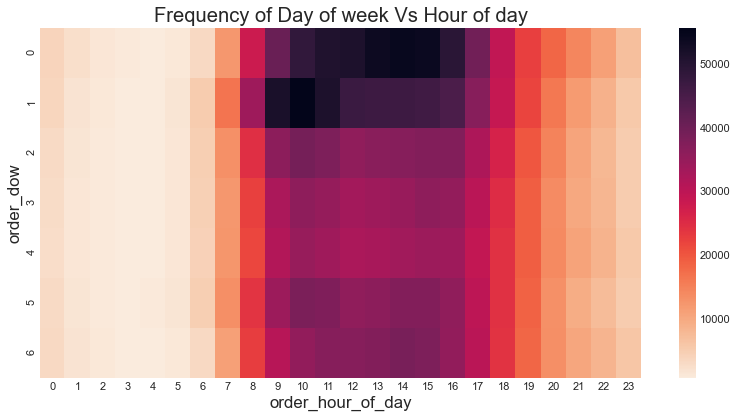

In [38]:
cmap = sns.cm.rocket_r

grouped_df = orders.groupby(["order_dow", "order_hour_of_day"])["order_number"].aggregate("count").reset_index()
grouped_df = grouped_df.pivot('order_dow', 'order_hour_of_day', 'order_number')

plt.figure(figsize=(12,6))
sns.heatmap(grouped_df,cmap = cmap)
plt.title("Frequency of Day of week Vs Hour of day")
plt.show()



check out the re-order percentage in prior set.

In [39]:
orderspp.head(10)

,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1
1,2,28985,2,1
2,2,9327,3,0
3,2,45918,4,1
4,2,30035,5,0
5,2,17794,6,1
6,2,40141,7,1
7,2,1819,8,1
8,2,43668,9,0
9,3,33754,1,1


In [40]:
# percentage of re-orders in prior set 
orderspp.reordered.sum() / orderspp.shape[0]

0.5896974667922161

In [41]:
# orderpt.head(10)

In [42]:
# percentage of re-orders in train set #
# orderpt.reordered.sum() / orderpt.shape[0]

On an average, about 59% of the products in an order are re-ordered products.

No re-ordered products:

Now that we have seen 59% of the products are re-ordered, there will also be situations when none of the products are re-ordered. Let us check that now.

In [43]:
grouped_df = orderspp.groupby("order_id")["reordered"].aggregate("sum").reset_index()
grouped_df["reordered"].loc[grouped_df["reordered"]>1] = 1
grouped_df.reordered.value_counts() / grouped_df.shape[0]

1    0.879151
0    0.120849
Name: reordered, dtype: float64

In [45]:
orderspp = pd.merge(orderspp, products, on='product_id', how='left')

In [46]:
orderspp.head()

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id
0,2,33120,1,1,Organic Egg Whites,86,16
1,2,28985,2,1,Michigan Organic Kale,83,4
2,2,9327,3,0,Garlic Powder,104,13
3,2,45918,4,1,Coconut Butter,19,13
4,2,30035,5,0,Natural Sweetener,17,13


In [47]:
cnt_srs = orderspp['product_name'].value_counts().reset_index().head(20)
cnt_srs.columns = ['product_name', 'frequency_count']
cnt_srs

,product_name,frequency_count
0,Banana,472565
1,Bag of Organic Bananas,379450
2,Organic Strawberries,264683
3,Organic Baby Spinach,241921
4,Organic Hass Avocado,213584
5,Organic Avocado,176815
6,Large Lemon,152657
7,Strawberries,142951
8,Limes,140627
9,Organic Whole Milk,137905


Wow. Most of them are organic products.! Also majority of them are fruits.

Now let us look at the important aisles.

In [48]:
orderspp = pd.merge(orderspp, aisles, on='aisle_id', how='left')

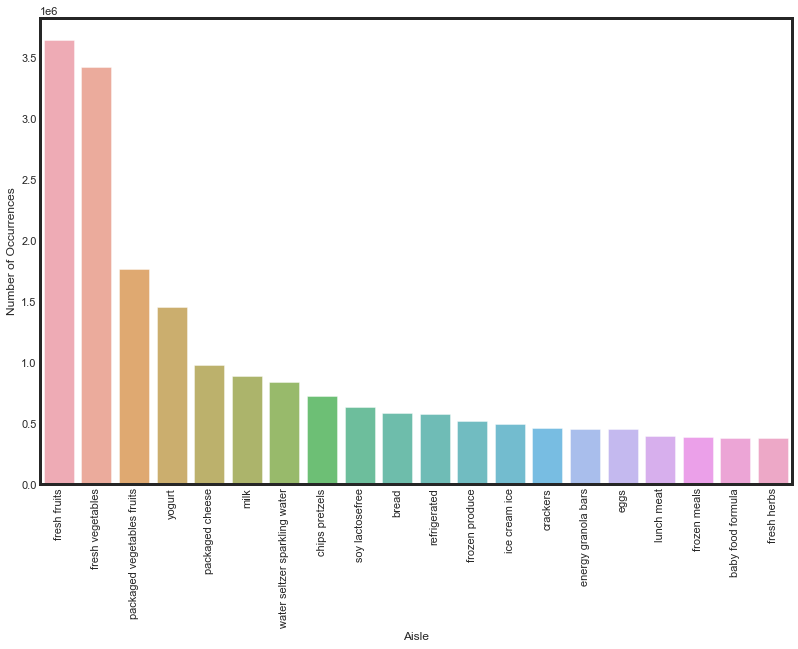

In [49]:
cnt_srs = orderspp['aisle'].value_counts().head(20)
plt.figure(figsize=(12,8))
sns.barplot(cnt_srs.index, cnt_srs.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Aisle', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()

The top two aisles are fresh fruits and fresh vegetables.!

Department Distribution:

Let us now check the department wise distribution.

In [50]:
orderspp = pd.merge(orderspp, departments, on='department_id', how='left')

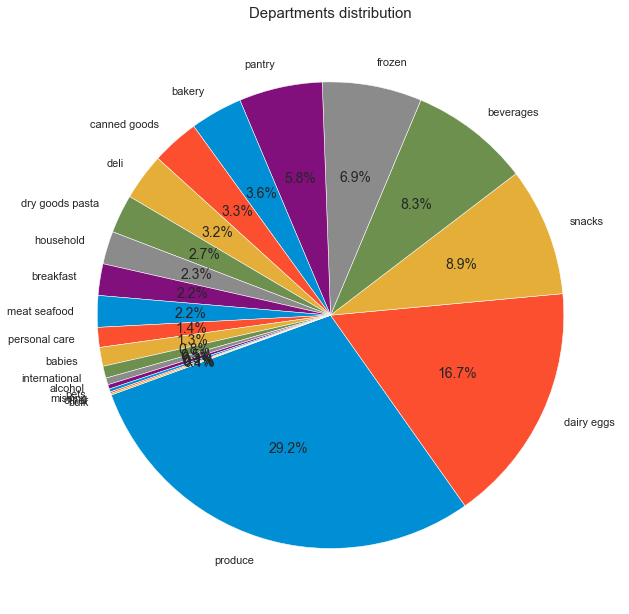

In [51]:
plt.figure(figsize=(10,10))
temp_series = orderspp['department'].value_counts()
labels = (np.array(temp_series.index))
sizes = (np.array((temp_series / temp_series.sum())*100))
plt.pie(sizes, labels=labels, 
        autopct='%1.1f%%', startangle=200)
plt.title("Departments distribution", fontsize=15)
plt.show()

Produce is the largest department. Now let us check the reordered percentage of each department.

Department wise reorder ratio:

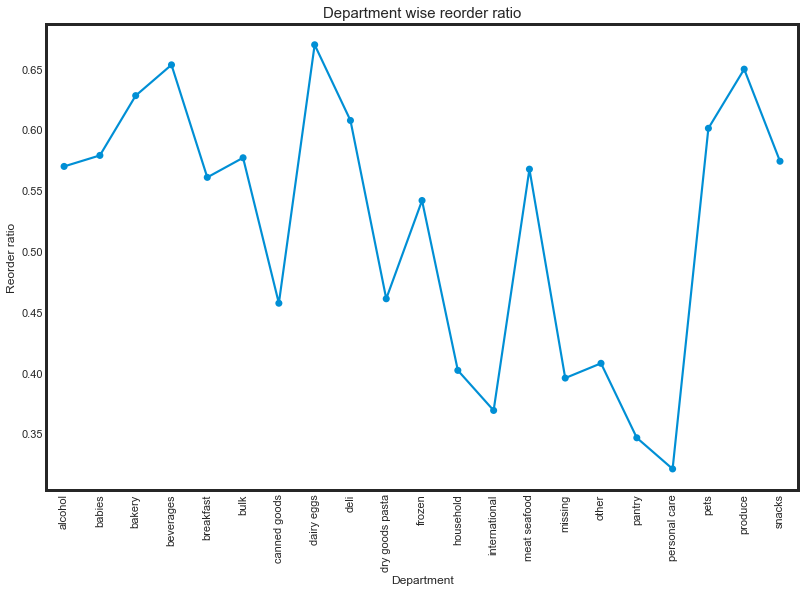

In [52]:
grouped_df = orderspp.groupby(["department"])["reordered"].aggregate("mean").reset_index()

plt.figure(figsize=(12,8))
sns.pointplot(grouped_df['department'].values, grouped_df['reordered'].values, alpha=0.8, scale=0.3)
plt.ylabel('Reorder ratio', fontsize=12)
plt.xlabel('Department', fontsize=12)
plt.title("Department wise reorder ratio", fontsize=15)
plt.xticks(rotation='vertical')
plt.show()

Personal care has lowest reorder ratio and dairy eggs have highest reorder ratio.

Aisle - Reorder ratio:

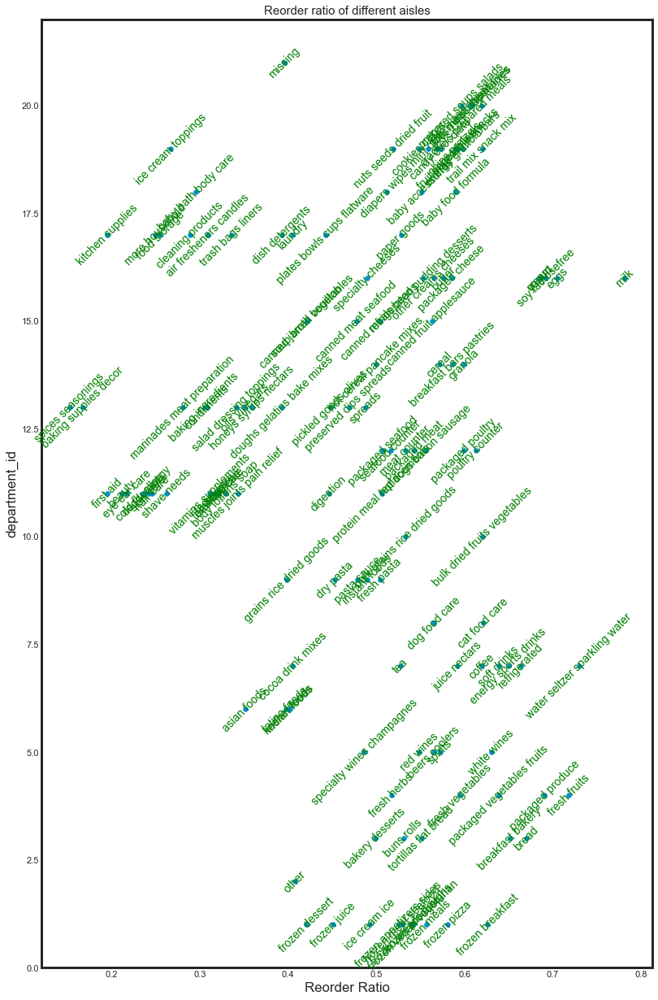

In [53]:
grouped_df = orderspp.groupby(["department_id", "aisle"])["reordered"].aggregate("mean").reset_index()

fig, ax = plt.subplots(figsize=(12,20))
ax.scatter(grouped_df.reordered.values, grouped_df.department_id.values)
for i, txt in enumerate(grouped_df.aisle.values):
    ax.annotate(txt, (grouped_df.reordered.values[i], grouped_df.department_id.values[i]), rotation=45, ha='center', va='center', color='green')
plt.xlabel('Reorder Ratio')
plt.ylabel('department_id')
plt.title("Reorder ratio of different aisles", fontsize=15)
plt.show()

Add to Cart - Reorder ratio:

Let us now explore the relationship between how order of adding the product to the cart affects the reorder ratio.

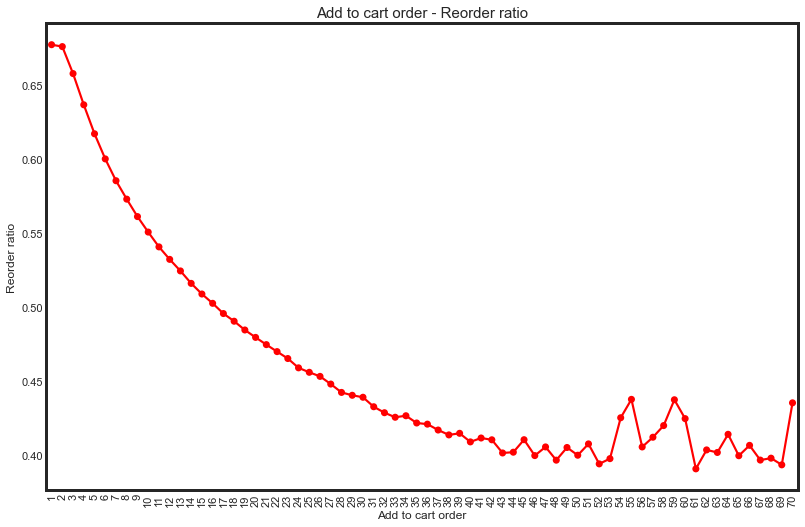

In [54]:
orderspp["add_to_cart_order_mod"] = orderspp["add_to_cart_order"].copy()
orderspp["add_to_cart_order_mod"].loc[orderspp["add_to_cart_order_mod"]>70] = 70
grouped_df = orderspp.groupby(["add_to_cart_order_mod"])["reordered"].aggregate("mean").reset_index()

plt.figure(figsize=(12,8))
sns.pointplot(grouped_df['add_to_cart_order_mod'].values, grouped_df['reordered'].values, alpha=0.8, color='red',scale = 0.3)
plt.ylabel('Reorder ratio', fontsize=12)
plt.xlabel('Add to cart order', fontsize=12)
plt.title("Add to cart order - Reorder ratio", fontsize=15)
plt.xticks(rotation='vertical')
plt.show()

Looks like the products that are added to the cart initially are more likely to be reordered again compared to the ones added later. This makes sense to me as well since we tend to first order all the products we used to buy frequently and then look out for the new products available.

Reorder ratio by Time based variables:

In [55]:
orderspp.groupby('department')['aisle'].value_counts(dropna=False)

department       aisle                        
alcohol          beers coolers                      48657
                 red wines                          35181
                 white wines                        30558
                 spirits                            28102
                 specialty wines champagnes         11198
babies           baby food formula                 382456
                 diapers wipes                      24605
                 baby bath body care                 8581
                 baby accessories                    8160
bakery           bread                             584834
                 breakfast bakery                  250770
                 tortillas flat bread              193297
                 buns rolls                        113015
                 bakery desserts                    34871
beverages        water seltzer sparkling water     841533
                 refrigerated                      575881
                 soft dri

In [56]:
pd.set_option('display.max_rows', None)

In [57]:
pd.set_option('display.max_rows', orderspp.shape[0]+1)

In [58]:
orderspp.groupby('department')['aisle'].value_counts(dropna=False)

department       aisle                        
alcohol          beers coolers                      48657
                 red wines                          35181
                 white wines                        30558
                 spirits                            28102
                 specialty wines champagnes         11198
babies           baby food formula                 382456
                 diapers wipes                      24605
                 baby bath body care                 8581
                 baby accessories                    8160
bakery           bread                             584834
                 breakfast bakery                  250770
                 tortillas flat bread              193297
                 buns rolls                        113015
                 bakery desserts                    34871
beverages        water seltzer sparkling water     841533
                 refrigerated                      575881
                 soft dri

In [59]:
orderspp['department'].value_counts(dropna=False)

produce            9479291
dairy eggs         5414016
snacks             2887550
beverages          2690129
frozen             2236432
pantry             1875577
bakery             1176787
canned goods       1068058
deli               1051249
dry goods pasta     866627
household           738666
breakfast           709569
meat seafood        708931
personal care       447123
babies              423802
international       269253
alcohol             153696
pets                 97724
missing              69145
other                36291
bulk                 34573
Name: department, dtype: int64

In [60]:
orderspp['aisle'].value_counts(dropna=False)

fresh fruits                     3642188
fresh vegetables                 3418021
packaged vegetables fruits       1765313
yogurt                           1452343
packaged cheese                   979763
milk                              891015
water seltzer sparkling water     841533
chips pretzels                    722470
soy lactosefree                   638253
bread                             584834
refrigerated                      575881
frozen produce                    522654
ice cream ice                     498425
crackers                          458838
energy granola bars               456386
eggs                              452134
lunch meat                        395130
frozen meals                      390299
baby food formula                 382456
fresh herbs                       377741
cereal                            377586
soft drinks                       357537
fresh dips tapenades              355685
soup broth bouillon               346464
juice nectars   

In [61]:
orderspp.groupby('department')['product_name'].value_counts(dropna=False)

department       product_name                                                                                                                                                   
alcohol          Sauvignon Blanc                                                                                                                                                      8246
                 Chardonnay                                                                                                                                                           6153
                 Cabernet Sauvignon                                                                                                                                                   6115
                 Beer                                                                                                                                                                 5844
                 Vodka                                                     

In [62]:
def am_or_pm(hour):
    if hour <= 11:
        return "am"
    elif hour >= 12:
        return "pm"
    else:
        return "unknown"

In [63]:
orders['am_or_pm'] = np.vectorize(am_or_pm)(orders['order_hour_of_day'])

In [64]:
orders.head()

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,am_or_pm
0,2539329,1,prior,1,2,8,NaN,am
1,2398795,1,prior,2,3,7,15.0,am
2,473747,1,prior,3,3,12,21.0,pm
3,2254736,1,prior,4,4,7,29.0,am
4,431534,1,prior,5,4,15,28.0,pm


In [65]:
df_am = orders[orders.am_or_pm == 'am']

In [66]:
df_am.head(5)

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,am_or_pm
0,2539329,1,prior,1,2,8,NaN,am
1,2398795,1,prior,2,3,7,15.0,am
3,2254736,1,prior,4,4,7,29.0,am
5,3367565,1,prior,6,2,7,19.0,am
6,550135,1,prior,7,1,9,20.0,am


In [67]:
df_pm = orders[orders.am_or_pm == 'pm']

In [68]:
df_pm.head(5)

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,am_or_pm
2,473747,1,prior,3,3,12,21.0,pm
4,431534,1,prior,5,4,15,28.0,pm
7,3108588,1,prior,8,1,14,14.0,pm
8,2295261,1,prior,9,1,16,0.0,pm
17,3194192,2,prior,7,2,12,14.0,pm


# STATISTICAL TESTING

In [69]:
#Welch's t-test
def welch_t(a,b, equal_var=False,describe = True ):
    #Calculate degrees of freedom
    dof_num = (a.var()/a.size + b.var()/b.size)**2
    dof_den =(a.var()/a.size)**2 / (a.size-1) + (b.var()/b.size)**2 / (b.size-1)
    dof = dof_num/dof_den
    #Perform Welch's t-test
    test, p_val = stats.ttest_ind(a,b, equal_var = equal_var)
    if describe:
        print(f"Welch's t-test = {test}\np-value: {p_val}\nDoF: {dof}")
        #Print decision.
        if p_val<0.05:
            print('Decision: Reject the null hypothesis')
        else:
            print('Decision: Fail to reject the null hypothesis')
    return stats.ttest_ind(a,b, equal_var = False)

In [70]:
from scipy import stats

In [71]:
stats.levene(df_am.order_number,df_pm.order_number)

LeveneResult(statistic=3432.6840737083658, pvalue=0.0)

In [72]:
stats.levene(df_am.user_id.value_counts(),df_pm.user_id.value_counts())

LeveneResult(statistic=7591.141448244115, pvalue=0.0)

In [74]:
df_am.user_id.value_counts().mean()

6.525189914204108

In [76]:
df_pm.user_id.value_counts().sum()

2226262

In [77]:
df_am.user_id.value_counts().sum()

1194821

In [78]:
df_am.shape

(1194821, 8)

In [79]:
welch1 = welch_t(df_am.user_id.value_counts(),df_pm.user_id.value_counts())

Welch's t-test = -141.82183714503853
p-value: 0.0
DoF: 368701.62768209964
Decision: Reject the null hypothesis


In [87]:
#Cohen's d Effect size
def cohen_d(a,b, describe = True):
    a_n,b_n = len(a),len(b)
    #Calculate pooled standard deviation.
    pv_num = ((a_n-1)*a.var())+((b_n-1)*b.var())
    pv_den = a_n+b_n
    pooled_sd = np.sqrt(pv_num/pv_den)
    d = (a.mean()-b.mean())/pooled_sd
    if describe:
        print("Cohens'd: ",d)
        if d<0.20:
            print('Effect Size: Very Small')
        elif d<0.50:
            print('Effect Size: Small')
        elif d<0.80:
            print('Effect Size: Medium')
        else:
            print('Effect Size: Large')
    return d

In [88]:
q = cohen_d(df_am.user_id.value_counts(),df_pm.user_id.value_counts())

Cohens'd:  -0.44822650192286756
Effect Size: Very Small


In [89]:
def plot_compare(a,b, title ='Quantities Ordered in the am or pm',
                labela = 'am', labelb='pm'):
    sns.distplot(a, label=labela, 
             color='orange', hist_kws=dict(alpha=.3))
    sns.distplot(b, label=labelb,
            color='blue', hist_kws=dict(alpha=.3))
    plt.axvline(df_am.order_number.mean(), 0,1, color='orange', 
            linestyle='--', label='Mean: '+str(round(a.mean(),2)))
    plt.axvline(df_pm.order_number.mean(), 0,1, color='blue', 
            linestyle='--', label='Mean: '+str(round(b.mean(),2) ))
    plt.title(title)
    plt.ylabel('frequency')
    plt.legend()
    plt.show();
    print(labela+' mean: ',round(a.mean()))
    print(labelb+' mean: ',round(b.mean()))
    print('Percentage difference: ',
          round((a.mean()-b.mean())/b.mean()*100, 2),'%')

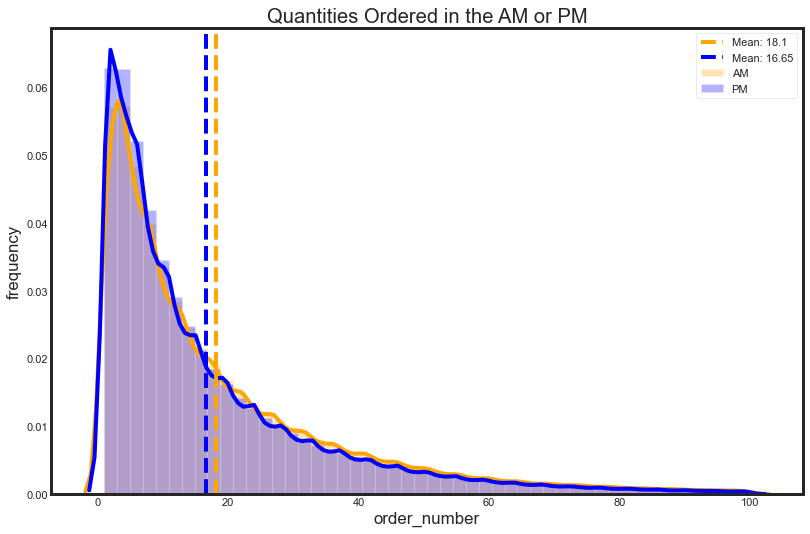

AM mean:  18
PM mean:  17
Percentage difference:  8.7 %


In [90]:
fig = plt.figure(figsize=(12,8))
plot_compare(df_am.order_number,df_pm.order_number, title ='Quantities Ordered in the AM or PM',
                labela = 'AM', labelb='PM')